# Automatically generating object masks with SAM

Since SAM can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image. This method was used to generate the dataset SA-1B.

The class `SamAutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

## Environment Set-up

If running locally using jupyter, first install `segment_anything` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything#installation) in the repository. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [4]:
using_colab = True

In [5]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.8.0+cu126
Torchvision version: 0.23.0+cu126
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-_aezyoco
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-_aezyoco
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=4b9eb23c9173d2835627c704677358f8ae1fdb04b91e18b2a7ef1d7e170b8d4a
  Stored in directory: /tmp/pip-ephem-wheel-cache-uaccgifj/wheels/29/82/ff/04e2be9805a1cb48bec0b85b5a6da6b63f647645750a0e42d4
Successfully built segment_anything
--2025-10-26 16:28:56--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com

## Set-up

In [6]:
!pip -q install ipympl==0.9.3 ipywidgets==8.1.1


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.6/511.6 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 62.8 MB/s eta 0:00:00


In [7]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [8]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

## Example image

In [10]:
image = cv2.imread('/content/JPG Image 2.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

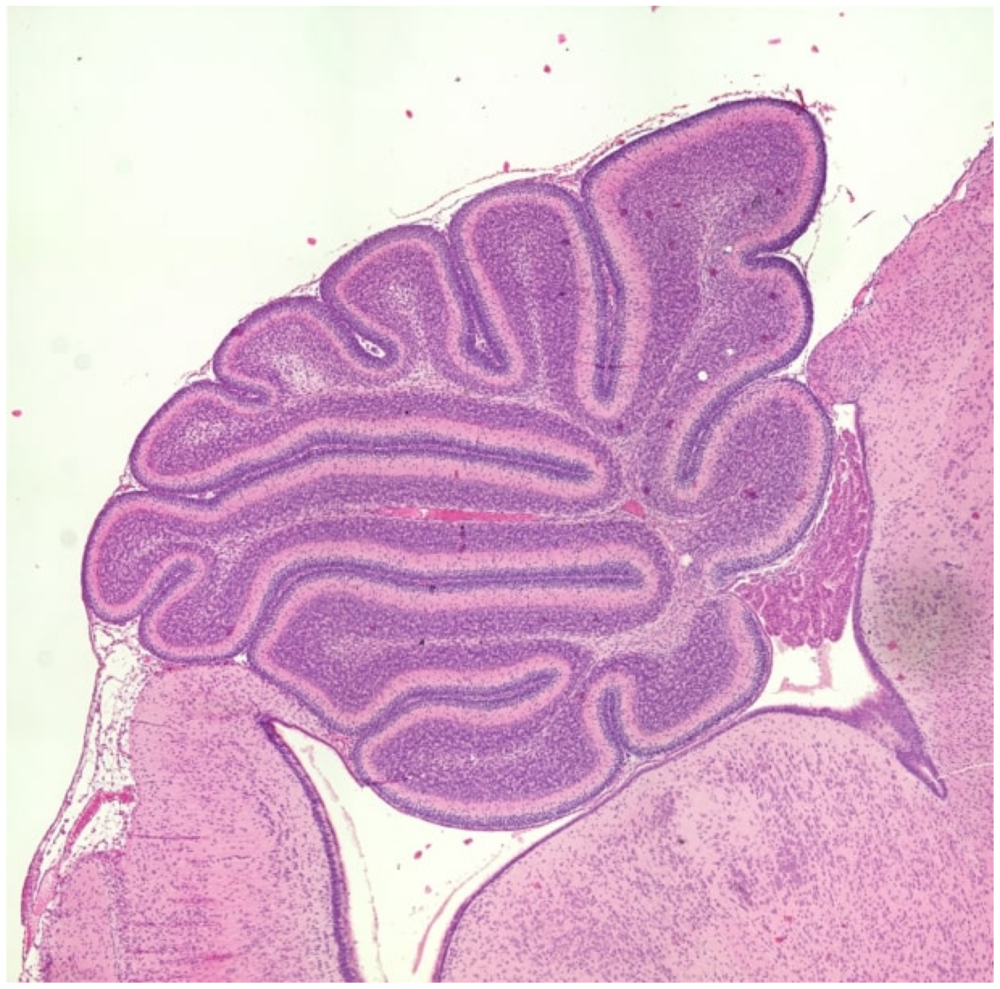

In [11]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

## Automatic mask generation

To run automatic mask generation, provide a SAM model to the `SamAutomaticMaskGenerator` class. Set the path below to the SAM checkpoint. Running on CUDA and with the default model is recommended.

In [12]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

To generate masks, just run `generate` on an image.

In [13]:
masks = mask_generator.generate(image)

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [14]:
print(len(masks))
print(masks[0].keys())

20
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


Show all the masks overlayed on the image.

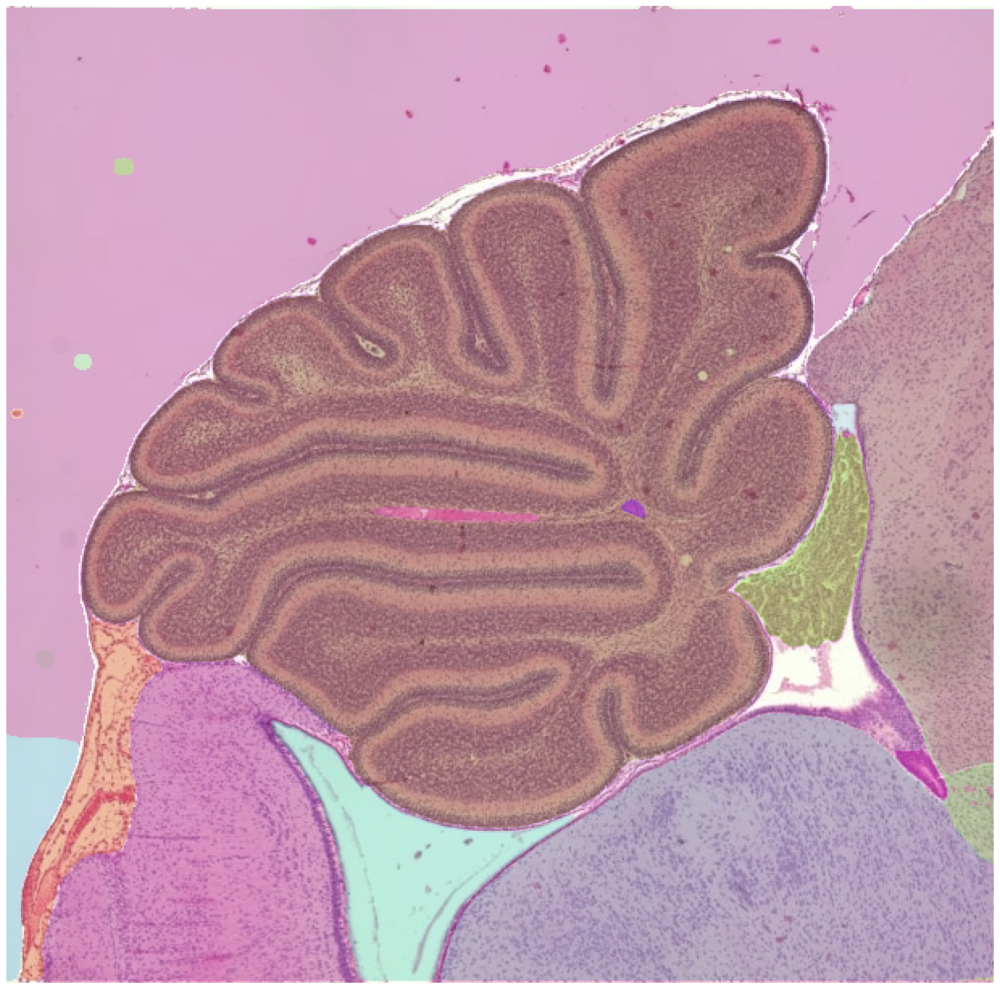

In [15]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [16]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

In [17]:
masks2 = mask_generator_2.generate(image)

In [18]:
len(masks2)

35

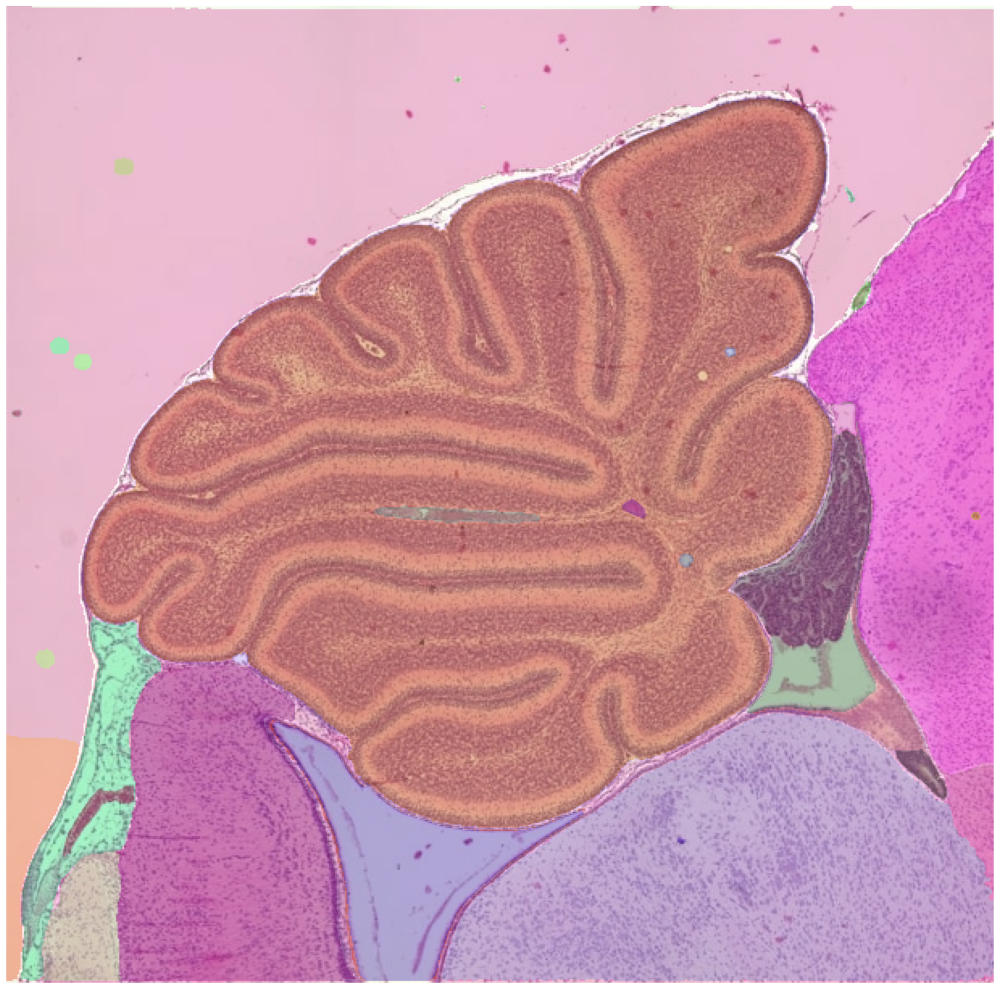

In [19]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show()

In [20]:
from google.colab import output
output.enable_custom_widget_manager()

Method 1: to use a backend tracing selector canvas for us to manually trace using mouse. This didn't work and hence, I've pivoted to using pixel based tracer to establish the working surface area for the model.

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128073 (\N{WHITE RIGHT POINTING BACKHAND INDEX}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


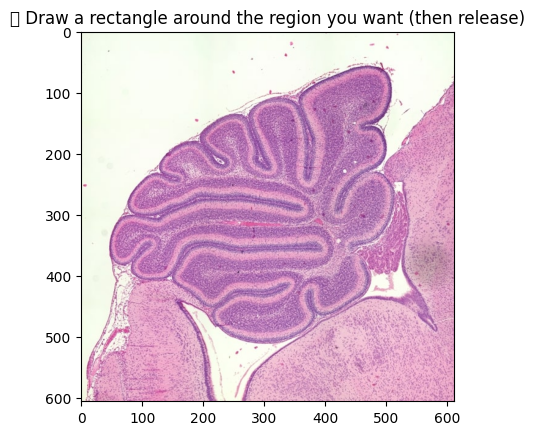

Rectangle coordinates: {}


In [21]:
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector
import numpy as np

fig, ax = plt.subplots()
ax.imshow(image)
coords = {}

def onselect(eclick, erelease):
    coords['x1'], coords['y1'] = int(eclick.xdata), int(eclick.ydata)
    coords['x2'], coords['y2'] = int(erelease.xdata), int(erelease.ydata)
    plt.close()

RectangleSelector(ax, onselect, useblit=True, button=[1])
plt.title("👉 Draw a rectangle around the region you want (then release)")
plt.show()

print("Rectangle coordinates:", coords)

In [32]:
import numpy as np, matplotlib.pyplot as plt, ipywidgets as w
from IPython.display import display
from segment_anything import SamPredictor

H, W = image.shape[:2]

# Sliders for X/Y ranges
x_slider = w.IntRangeSlider(
    value=[W//4, 3*W//4], min=0, max=W-1, step=1, description='X range', continuous_update=False
)
y_slider = w.IntRangeSlider(
    value=[H//4, 3*H//4], min=0, max=H-1, step=1, description='Y range', continuous_update=False
)

btn_preview = w.Button(description='Preview box')
btn_run = w.Button(description='Run SAM in box', button_style='primary')
out = w.Output()

def draw_preview():
    with out:
        out.clear_output(wait=True)
        x1, x2 = x_slider.value
        y1, y2 = y_slider.value
        fig, ax = plt.subplots(figsize=(6,6))
        ax.imshow(image)
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, lw=2))
        ax.set_axis_off()
        ax.set_title(f"Preview box: x=[{x1},{x2}], y=[{y1},{y2}]")
        plt.show()

def run_sam(_):
    x1, x2 = x_slider.value
    y1, y2 = y_slider.value
    predictor = SamPredictor(sam)
    predictor.set_image(image)
    box = np.array([x1, y1, x2, y2])

    masks, scores, logits = predictor.predict(box=box, multimask_output=True)

    with out:
        # show contours
        fig, ax = plt.subplots(figsize=(6,6))
        ax.imshow(image)
        for m in masks:
            ax.contour(m, levels=[0.5], linewidths=2)
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, lw=1))
        ax.set_title("SAM masks inside selected box")
        ax.set_axis_off()
        plt.show()

btn_preview.on_click(lambda _: draw_preview())
btn_run.on_click(run_sam)

display(x_slider, y_slider, w.HBox([btn_preview, btn_run]), out)
draw_preview()

IntRangeSlider(value=(153, 459), continuous_update=False, description='X range', max=611)

IntRangeSlider(value=(151, 454), continuous_update=False, description='Y range', max=605)

Output()

In [37]:
import cv2

# Use the same sliders’ values
x1, x2 = x_slider.value
y1, y2 = y_slider.value

# Crop of the image box
crop = image[y1:y2, x1:x2]
plt.imsave("selected_region.png", crop)

# Combine all SAM masks from the last run (if you kept 'masks' in memory)
combo = np.logical_or.reduce([m['segmentation'] for m in masks]).astype(np.uint8) # Combine masks using logical OR
rgba = np.dstack([image, np.expand_dims(combo*255, axis=2)])
cv2.imwrite("box_cutout.png", cv2.cvtColor(rgba, cv2.COLOR_RGBA2BGRA))

# Clean + outline
kernel = np.ones((5,5), np.uint8)
clean = cv2.morphologyEx(combo, cv2.MORPH_CLOSE, kernel, iterations=1)
contours, _ = cv2.findContours(clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
if contours:
    cnt = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(cnt, True)
    cnt = cv2.approxPolyDP(cnt, 0.01*peri, True)
    outline = np.zeros((*combo.shape, 3), np.uint8)
    cv2.polylines(outline, [cnt], True, (255,255,255), 2)
    cv2.imwrite("box_outline.png", outline)

print("Saved: selected_region.png, box_cutout.png, box_outline.png")

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [38]:
#exploring new technique

from segment_anything import SamPredictor
import numpy as np

# If you picked a box with sliders, reuse x1,y1,x2,y2
predictor = SamPredictor(sam)
predictor.set_image(image)
box = np.array([x1, y1, x2, y2])

masks, scores, _ = predictor.predict(box=box, multimask_output=True)
outer_mask = np.any(masks, axis=0).astype(np.uint8)  # 0/1


In [39]:
import numpy as np, cv2, matplotlib.pyplot as plt
from skimage.color import rgb2hed
from skimage.morphology import skeletonize, remove_small_objects

# Limit work to the selected box (optional but faster)
patch = image[y1:y2, x1:x2]
patch_mask = outer_mask[y1:y2, x1:x2]

# Color deconvolution: isolate Hematoxylin (nuclei-rich, strong laminar contrast)
hed = rgb2hed(patch)                  # float, H/E/DAB
h = hed[...,0]
h = (h - h.min()) / (h.max() - h.min() + 1e-8)  # normalize to 0..1

# Edge detection on hematoxylin channel
h_u8 = (h*255).astype(np.uint8)
blur = cv2.GaussianBlur(h_u8, (5,5), 0)
edges = cv2.Canny(blur, 30, 90)

# Keep edges only inside cerebellum region
edges = cv2.bitwise_and(edges, edges, mask=(patch_mask*255))

# Clean & thin
edges_bool = edges > 0
edges_bool = remove_small_objects(edges_bool, 64)        # drop specks
thin = skeletonize(edges_bool).astype(np.uint8)*255      # 1-pixel lines


In [40]:
import numpy as np, cv2, matplotlib.pyplot as plt
from skimage.color import rgb2hed
from skimage.morphology import skeletonize, remove_small_objects

# Limit work to the selected box (optional but faster)
patch = image[y1:y2, x1:x2]
patch_mask = outer_mask[y1:y2, x1:x2]

# Color deconvolution: isolate Hematoxylin (nuclei-rich, strong laminar contrast)
hed = rgb2hed(patch)                  # float, H/E/DAB
h = hed[...,0]
h = (h - h.min()) / (h.max() - h.min() + 1e-8)  # normalize to 0..1

# Edge detection on hematoxylin channel
h_u8 = (h*255).astype(np.uint8)
blur = cv2.GaussianBlur(h_u8, (5,5), 0)
edges = cv2.Canny(blur, 30, 90)

# Keep edges only inside cerebellum region
edges = cv2.bitwise_and(edges, edges, mask=(patch_mask*255))

# Clean & thin
edges_bool = edges > 0
edges_bool = remove_small_objects(edges_bool, 64)        # drop specks
thin = skeletonize(edges_bool).astype(np.uint8)*255      # 1-pixel lines


**We are trying to extract the outer most layer through the masks generated before. This traces only the part of cerebellum that we need, negating everything else that we would not need to be traced from the whole MRI.**

**Next steps, I try to go into the internal surface area masks created before for the model to accurately trace the fine line's inside the brain's cerebellum**

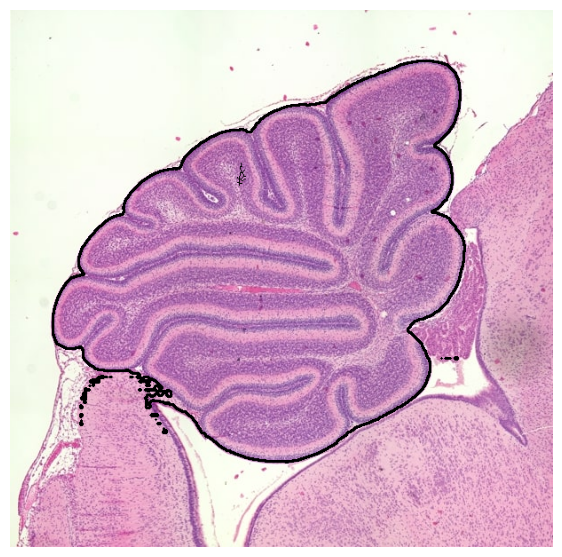

True

In [41]:
# Black tracing on original patch
overlay = patch.copy()
# draw outer boundary
cnts,_ = cv2.findContours((patch_mask*255), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(overlay, cnts, -1, (0,0,0), 2)
# draw inner lines
ys, xs = np.where(thin>0)
overlay[ys, xs] = (0,0,0)

# Merge back into full image (optional)
result = image.copy()
result[y1:y2, x1:x2] = overlay

plt.figure(figsize=(7,7)); plt.imshow(result); plt.axis('off'); plt.show()
cv2.imwrite("cerebellum_tracing_full.png", cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
cv2.imwrite("cerebellum_tracing_patch.png", cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))


**I'm using image filters like frangi, meijering and sato here. All three are Specific libraries used in studying human body scan's and are developed by scientists working at the intersection of bio-informatics.**

**The process is still in very nascent stage, as to accurately extract brain cerebellum trace, we need our image to be very clean and with less noise. Need to use noise reduction techniques and masking techniques hand in hand for our segmentation model to accurately trace the inner linings of the cerebellum.**

In [42]:
#Another Method

!pip -q install scikit-image


In [43]:
import numpy as np, cv2, matplotlib.pyplot as plt
from skimage.color import rgb2hed
from skimage.exposure import equalize_adapthist
from skimage.filters import frangi, meijering, sato
from skimage.morphology import skeletonize, remove_small_objects, binary_opening, disk

# --- inputs you already have ---
# image: RGB np.array (H, W, 3)
# outer_mask: 0/1 mask of cerebellum (union of SAM masks)
# optional: x1,y1,x2,y2 if you worked inside a box

H, W = image.shape[:2]
roi = outer_mask.astype(bool)

# 1) emphasize hematoxylin (laminae stand out there)
hed = rgb2hed(image)                # H,E,DAB
h = hed[...,0]
h = (h - h.min()) / (h.max() - h.min() + 1e-8)

# 2) local contrast boost
h_eq = equalize_adapthist(h, clip_limit=0.02)

# 3) ridge detection (try one; frangi is a good start)
ridge = sato(h_eq, sigmas=(1,2,3), black_ridges=False)
# (If too faint, try meijering or sato:)
# ridge = meijering(h_eq, sigmas=range(1,5), black_ridges=False)

# 4) keep inside cerebellum and suppress the outer border
#    (erode mask to avoid picking the outer contour)
inner_roi = cv2.erode(outer_mask, np.ones((9,9), np.uint8), iterations=1).astype(bool)
r_in = np.zeros_like(ridge)
r_in[inner_roi] = ridge[inner_roi]

# 5) binarize ridge map (tune thr if needed)
thr = np.percentile(r_in[inner_roi], 65)  # upper quartile; adjust 65–85 if needed
lines = (r_in > thr)

# 6) clean + thin
lines = remove_small_objects(lines, 100)                    # drop specks
lines = binary_opening(lines, footprint=disk(1))            # tiny gaps
thin  = skeletonize(lines).astype(np.uint8)                 # 1-px lines


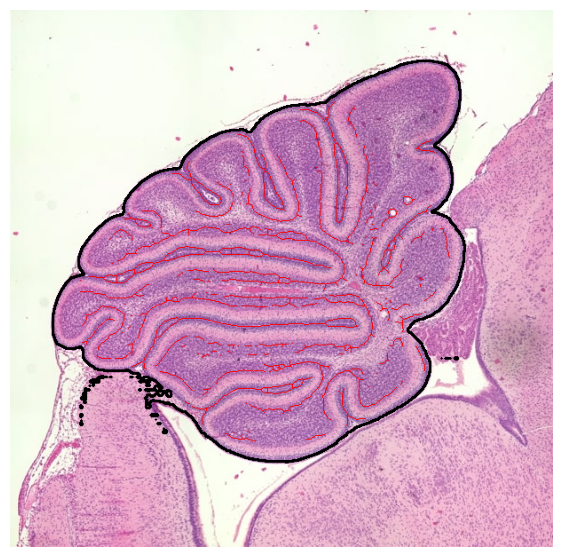

In [44]:
overlay = image.copy()
y,x = np.where(thin>0)
overlay[y, x] = (255, 0, 0)  # RED lines so they stand out

# Draw the outer border in black too (for reference)
cnts,_ = cv2.findContours((outer_mask*255), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(overlay, cnts, -1, (0,0,0), 2)

plt.figure(figsize=(7,7)); plt.imshow(overlay); plt.axis('off'); plt.show()


In [45]:
#Moving the traced image from color to Black and white for easier trace.

import numpy as np, cv2

# ---- settings (BGR because OpenCV saves in BGR order) ----
outer_color = (255,255,255)   # white border
inner_color = (0,0,255)       # red inner trace
outer_thickness = 2
inner_thickness = 2

# ---- make trace-only image for the PATCH (black background) ----
trace_patch = np.zeros((patch.shape[0], patch.shape[1], 3), np.uint8)  # black canvas

# outer border
cnts,_ = cv2.findContours((patch_mask*255), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(trace_patch, cnts, -1, outer_color, outer_thickness)

# inner lines (dilate to make them visible)
inner_mask = cv2.dilate((thin>0).astype(np.uint8),
                        np.ones((inner_thickness, inner_thickness), np.uint8), 1)
ys, xs = np.where(inner_mask>0)

# Clip indices to be within bounds of trace_patch
ys = np.clip(ys, 0, trace_patch.shape[0] - 1)
xs = np.clip(xs, 0, trace_patch.shape[1] - 1)

trace_patch[ys, xs] = inner_color

cv2.imwrite("trace_only_patch_black.png", trace_patch)

# ---- put the patch trace back into a FULL-SIZE black canvas ----
H, W = image.shape[:2]
trace_full = np.zeros((H, W, 3), np.uint8)
trace_full[y1:y2, x1:x2] = trace_patch
cv2.imwrite("trace_only_full_black.png", trace_full)

# ---- OPTIONAL: transparent background (trace only, no black) ----
alpha_patch = np.zeros((patch.shape[0], patch.shape[1]), np.uint8)
alpha_patch[ys, xs] = 255  # inner lines opaque

# add outer border to alpha
outer_mask_px = np.zeros_like(alpha_patch)
cv2.drawContours(outer_mask_px, cnts, -1, 255, outer_thickness)
alpha_patch = np.maximum(alpha_patch, outer_mask_px)

# combine RGBA
bgra_patch = np.zeros((patch.shape[0], patch.shape[1], 4), np.uint8)
bgra_patch[..., :3] = trace_patch
bgra_patch[..., 3] = alpha_patch
cv2.imwrite("trace_only_patch_transparent.png", bgra_patch)

# full-size transparent canvas
alpha_full = np.zeros((H, W), np.uint8)
alpha_full[y1:y2, x1:x2] = alpha_patch
bgra_full = np.zeros((H, W, 4), np.uint8)
bgra_full[y1:y2, x1:x2, :3] = trace_patch
bgra_full[..., 3] = alpha_full
cv2.imwrite("trace_only_full_transparent.png", bgra_full)

print("✅ Saved four files:")
print("  • trace_only_patch_black.png")
print("  • trace_only_full_black.png")
print("  • trace_only_patch_transparent.png")
print("  • trace_only_full_transparent.png")

✅ Saved four files:
  • trace_only_patch_black.png
  • trace_only_full_black.png
  • trace_only_patch_transparent.png
  • trace_only_full_transparent.png


**Making the outer line thin**


In [49]:
import numpy as np, cv2
from skimage.morphology import skeletonize

# Re-thin your binary mask to 1-px width
inner = (thin > 0).astype(bool)
inner = skeletonize(inner)

# New canvas
trace_patch = np.zeros((patch.shape[0], patch.shape[1], 3), np.uint8)

# Outer boundary – crisp and thin
cnts, _ = cv2.findContours((patch_mask*255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(trace_patch, cnts, -1, (255,255,255), 1, lineType=cv2.LINE_AA)

# Inner lines – truly 1-pixel width
ys, xs = np.where(inner)

# Clip indices to be within bounds of trace_patch
ys = np.clip(ys, 0, trace_patch.shape[0] - 1)
xs = np.clip(xs, 0, trace_patch.shape[1] - 1)

trace_patch[ys, xs] = (0,0,255)   # red in BGR

cv2.imwrite("trace_only_thin.png", trace_patch)

True